In [1]:
import os
import gc
import numpy as np
import pandas as pd
import tifffile

directory = "/mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images"

dfs = []
tiffs = {}

files = os.listdir(directory)

for file in files:
    if file.endswith(".ome.tif"):
        filename = file.split('.')[0].removesuffix('_morphology_focus')
        tiff = tifffile.imread(os.path.join(directory, file), is_ome=False, level=0)
        tiffs[filename] = tiff
        print(f"Loaded {directory} with shape {tiff.shape}")

Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (24864, 31348)
Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (20739, 28492)
Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (20741, 28491)
Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (24863, 31342)
Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (20727, 28494)
Loaded /mlbio_scratch/anagupta/xenium_preprocessed/donor_tiff_images with shape (24869, 28482)


In [8]:
import pandas as pd
data = pd.read_csv('/mlbio_scratch/anagupta/xenium_preprocessed/10xgenomics_alzheimers_disease_mouse_data_shuffled.csv')
print("Loaded data: ", data.shape)
print(data.columns)

# import pandas as pd
# data = pd.read_csv('/Users/ananyagupta/MLBio/sliced_data/sliced_data.csv')
# print("Loaded data: ", data.shape)
# print(data.columns)

KeyboardInterrupt: 

In [3]:
data.shape

(350297, 360)

In [4]:
def window_slicing(tiff, data, window_size=8192, overlap=128):
    h, w = tiff.shape[:2]
    for i in range(0, h, window_size - overlap):
        for j in range(0, w, window_size - overlap):
            window = tiff[i:i+window_size, j:j+window_size]
            if window.shape[0] != window_size or window.shape[1] != window_size:
                window = np.pad(window, ((0, window_size - window.shape[0]), (0, window_size - window.shape[1])), mode='constant', constant_values=0)
            scale_factor = .2125 # um/px
            px_min = j * scale_factor
            px_max = (j + window_size) * scale_factor
            py_min = i * scale_factor
            py_max = (i + window_size) * scale_factor
            # print(px_min, px_max, py_min, py_max)
            window_data = data[
                (data['coord_X'] >= px_min ) &
                (data['coord_Y'] >= py_min ) &
                (data['coord_X'] < px_max) &
                (data['coord_Y'] < py_max)
            ]
            # window_data = data.filter(pl.col("coord_X").ge(px_min) & pl.col("coord_Y").ge(py_min) & pl.col("coord_X").lt(px_max) & pl.col("coord_Y").lt(py_max))
            yield window, window_data, px_min, py_min

In [5]:
sliced_tiffs = {}
sliced_data = {}

donors = data['donor'].unique()

all_ids = set()
for donor in donors:
    donor_data = data[data['donor'] == donor]
    tiff = tiffs[donor]
    i = 1
    for window, window_data, offset_x, offset_y in window_slicing(tiff, donor_data):
        slice_name = donor + '__' + str(i)
        sliced_tiffs[slice_name] = window
        
        if not window_data.empty:
            target_ids = set(window_data['cell_id'].unique())
            # mask = data['cell_id'].isin(target_ids)
            # data.loc[mask, 'cell_section'] = slice_name
            # data.loc[mask, 'coord_X'] -= offset_x
            # data.loc[mask, 'coord_Y'] -= offset_y
            
            window_data = window_data.copy()
            window_data.loc[:, 'original_coord_X'] = window_data['coord_X']
            window_data.loc[:, 'original_coord_Y'] = window_data['coord_Y']
            window_data.loc[:, 'coord_X'] -= offset_x
            window_data.loc[:, 'coord_Y'] -= offset_y
            window_data.loc[:, 'cell_section'] = slice_name
        
        sliced_data[slice_name] = window_data
        ids = set(window_data['cell_id'])
        overlap = all_ids & ids
        # if overlap:
        #     print(f"Overlap found in {donor} {i}")
        #     print(overlap)
        all_ids.update(ids)
        i += 1
    print(f"Sliced {i-1} windows from {tiff.shape}")

print(len(sliced_tiffs))
print(len(sliced_data))

sum = 0

for slice_name, window_data in sliced_data.items():
    sum = sum + len(window_data)
    print(slice_name, len(window_data))

print(sum)

Sliced 16 windows from (24869, 28482)
Sliced 16 windows from (24863, 31342)
Sliced 16 windows from (24864, 31348)
Sliced 12 windows from (20739, 28492)
Sliced 12 windows from (20727, 28494)
Sliced 12 windows from (20741, 28491)
84
84
wildtype_5_7__1 3556
wildtype_5_7__2 4250
wildtype_5_7__3 4312
wildtype_5_7__4 3147
wildtype_5_7__5 7013
wildtype_5_7__6 7875
wildtype_5_7__7 8197
wildtype_5_7__8 2618
wildtype_5_7__9 2260
wildtype_5_7__10 8353
wildtype_5_7__11 6964
wildtype_5_7__12 1700
wildtype_5_7__13 1
wildtype_5_7__14 143
wildtype_5_7__15 36
wildtype_5_7__16 0
wildtype_13_4__1 4316
wildtype_13_4__2 3847
wildtype_13_4__3 4215
wildtype_13_4__4 2195
wildtype_13_4__5 6233
wildtype_13_4__6 6554
wildtype_13_4__7 7902
wildtype_13_4__8 4163
wildtype_13_4__9 5034
wildtype_13_4__10 8681
wildtype_13_4__11 7436
wildtype_13_4__12 627
wildtype_13_4__13 55
wildtype_13_4__14 434
wildtype_13_4__15 130
wildtype_13_4__16 16
TgCRND8_17_9__1 5864
TgCRND8_17_9__2 8307
TgCRND8_17_9__3 6313
TgCRND8_17_9__4 5

In [6]:
# concate all sliced data
sliced_data_concat = pd.concat(sliced_data.values(), ignore_index=True)
print(sliced_data_concat.shape)

# count duplicates in sliced_data_concat
sliced_data_concat['cell_id'].value_counts()

sliced_data_concat.rename(columns={'cell_id': 'original_cell_id'}, inplace=True)
sliced_data_concat['cell_id'] = sliced_data_concat.index

print(sliced_data_concat.head())
output_dir = "/mlbio_scratch/anagupta/xenium_preprocessed/sliced_data"

# save the concatenated data as csv
sliced_data_concat.to_csv(os.path.join(output_dir, 'data2.csv'), index=False)
print(f"Saved {len(data)} rows")


(360611, 362)
  original_cell_id      coord_X      coord_Y  transcript_counts  \
0       cdokkplh-1   369.561494  1605.220020                261   
1       ccocmdmi-1   628.624390  1232.846350                 38   
2       cekhbeac-1   346.296869  1556.784235                358   
3       jnfdlljf-1  1498.620660  1161.344458                162   
4       dghggmae-1   714.048611  1739.703986                125   

   control_probe_counts  control_codeword_counts  unassigned_codeword_counts  \
0                     0                        0                           0   
1                     0                        0                           0   
2                     0                        0                           0   
3                     0                        0                           0   
4                     0                        0                           0   

   total_counts   cell_area  nucleus_area  ...  Vim  Vip Vwc2l  Wfs1  Zfp366  \
0           261  221.4

Saved 350297 rows


In [4]:
slice_name = 'wildtype_5_7__4'

slice = sliced_data[slice_name]

NameError: name 'sliced_data' is not defined

In [1]:
import pandas as pd
data = pd.read_csv('/mlbio_scratch/anagupta/xenium_preprocessed/sliced_data.csv', usecols=["coord_X", "coord_Y", "cell_id", "donor", "cell_class", "cell_section"])

In [4]:
# print number of cells in each cell_section
# print(data['cell_section'].value_counts())

for cell_section in data['cell_section'].unique():
    print(cell_section, len(data[data['cell_section'] == cell_section]))

wildtype_5_7__1 3556
wildtype_5_7__2 4250
wildtype_5_7__3 4312
wildtype_5_7__4 3147
wildtype_5_7__5 7013
wildtype_5_7__6 7875
wildtype_5_7__7 8197
wildtype_5_7__8 2618
wildtype_5_7__9 2260
wildtype_5_7__10 8353
wildtype_5_7__11 6964
wildtype_5_7__12 1700
wildtype_5_7__13 1
wildtype_5_7__14 143
wildtype_5_7__15 36
wildtype_13_4__1 4316
wildtype_13_4__2 3847
wildtype_13_4__3 4215
wildtype_13_4__4 2195
wildtype_13_4__5 6233
wildtype_13_4__6 6554
wildtype_13_4__7 7902
wildtype_13_4__8 4163
wildtype_13_4__9 5034
wildtype_13_4__10 8681
wildtype_13_4__11 7436
wildtype_13_4__12 627
wildtype_13_4__13 55
wildtype_13_4__14 434
wildtype_13_4__15 130
wildtype_13_4__16 16
TgCRND8_17_9__1 5864
TgCRND8_17_9__2 8307
TgCRND8_17_9__3 6313
TgCRND8_17_9__4 5021
TgCRND8_17_9__5 4968
TgCRND8_17_9__6 7622
TgCRND8_17_9__7 8054
TgCRND8_17_9__8 4505
TgCRND8_17_9__9 509
TgCRND8_17_9__10 5865
TgCRND8_17_9__11 4448
TgCRND8_17_9__12 1008
TgCRND8_17_9__16 1
TgCRND8_2_5__1 6819
TgCRND8_2_5__2 6747
TgCRND8_2_5__3 8190


In [10]:
import pandas as pd
data = pd.read_csv('/mlbio_scratch/anagupta/luna/data/train_test_split_3N2D_1D/train_data.csv')

In [1]:
import os
import tarfile

data_dir = '/mlbio_scratch/anagupta/xenium_preprocessed/'
cell_images_path = '/mlbio_scratch/anagupta/luna/data/train_test_split_3N2D_1D_2/train_cell_images.tar'

with tarfile.open(cell_images_path, 'r') as tar:
    for member in tar.getmembers():
        print(member.name)

TgCRND8_17_9/aaabiggh-1.npy
TgCRND8_17_9/aaacfoel-1.npy
TgCRND8_17_9/aaaeefil-1.npy
TgCRND8_17_9/aaaehidd-1.npy
TgCRND8_17_9/aaagcbkg-1.npy
TgCRND8_17_9/aaaglmho-1.npy
TgCRND8_17_9/aaajihne-1.npy
TgCRND8_17_9/aaamgfhn-1.npy
TgCRND8_17_9/aaamimnm-1.npy
TgCRND8_17_9/aaaocmpe-1.npy
TgCRND8_17_9/aaapfdgo-1.npy
TgCRND8_17_9/aabblhbk-1.npy
TgCRND8_17_9/aabbokgl-1.npy
TgCRND8_17_9/aabcchng-1.npy
TgCRND8_17_9/aabdhjie-1.npy
TgCRND8_17_9/aabfokel-1.npy
TgCRND8_17_9/aabgedfi-1.npy
TgCRND8_17_9/aabjccao-1.npy
TgCRND8_17_9/aabjkkkp-1.npy
TgCRND8_17_9/aabkcaoo-1.npy
TgCRND8_17_9/aabkgile-1.npy
TgCRND8_17_9/aabljnfd-1.npy
TgCRND8_17_9/aabmlddc-1.npy
TgCRND8_17_9/aabmmpok-1.npy
TgCRND8_17_9/aabnjjbd-1.npy
TgCRND8_17_9/aabpfcna-1.npy
TgCRND8_17_9/aacacnde-1.npy
TgCRND8_17_9/aacafjke-1.npy
TgCRND8_17_9/aacalodd-1.npy
TgCRND8_17_9/aacdijfn-1.npy
TgCRND8_17_9/aaceaadn-1.npy
TgCRND8_17_9/aaceaaeg-1.npy
TgCRND8_17_9/aaceekkm-1.npy
TgCRND8_17_9/aacfpmee-1.npy
TgCRND8_17_9/aachijek-1.npy
TgCRND8_17_9/aachpfb

In [9]:
with tarfile.open(cell_images_path, 'r') as tar:
    print(len(tar.getmembers()))

351711


In [11]:
data.rename(columns={'cell_id': 'original_cell_id'}, inplace=True)
data['cell_id'] = data.index

In [13]:
print(data['original_cell_id'].unique().shape)
print(data.shape)

(291529,)
(291604, 361)


Plotting  wildtype_5_7__1


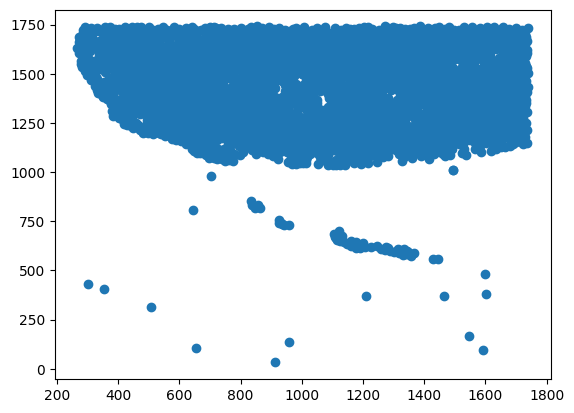

Plotting  wildtype_5_7__2


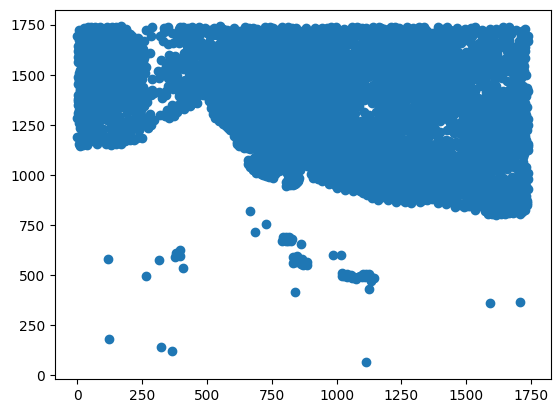

Plotting  wildtype_5_7__3


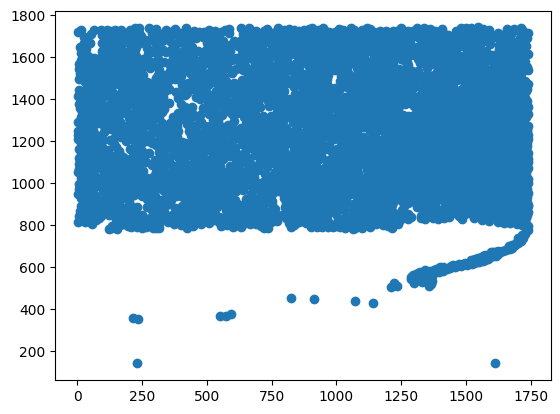

Plotting  wildtype_5_7__4


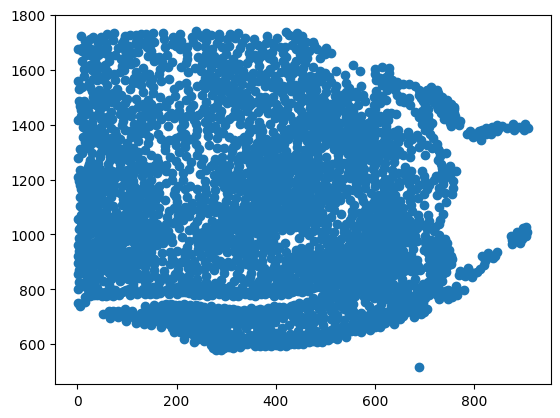

Plotting  wildtype_5_7__5


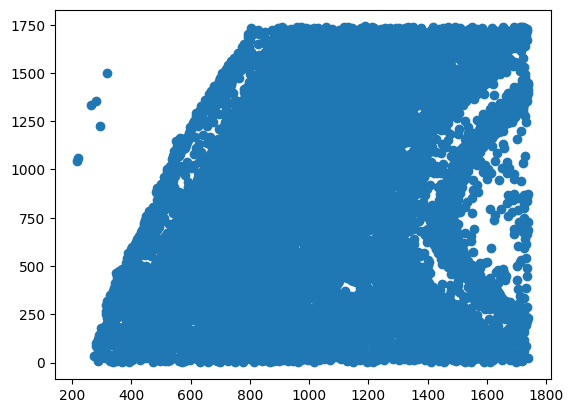

Plotting  wildtype_5_7__6


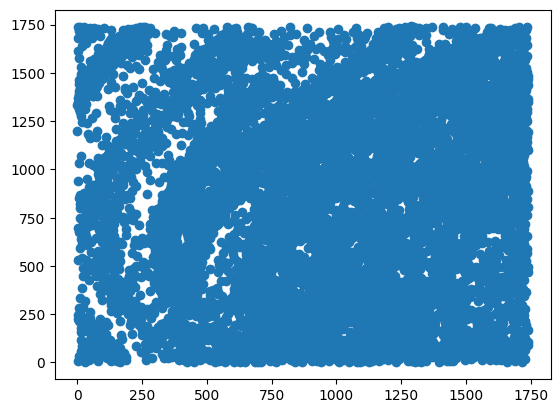

Plotting  wildtype_5_7__7


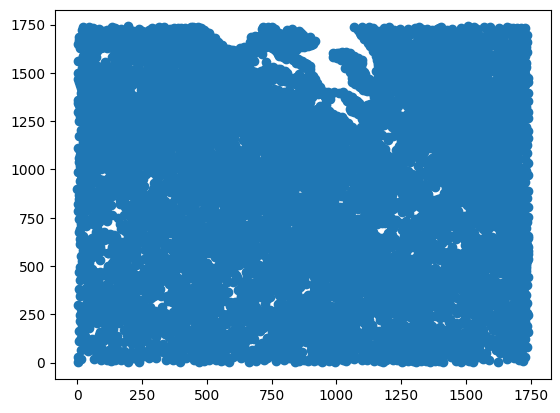

Plotting  wildtype_5_7__8


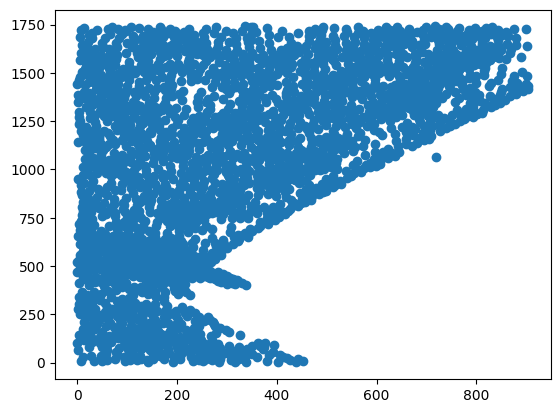

Plotting  wildtype_5_7__9


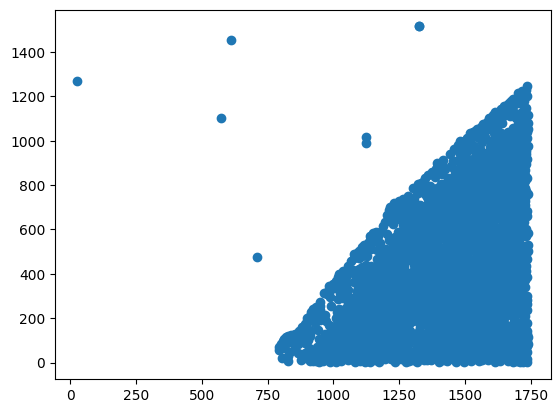

Plotting  wildtype_5_7__10


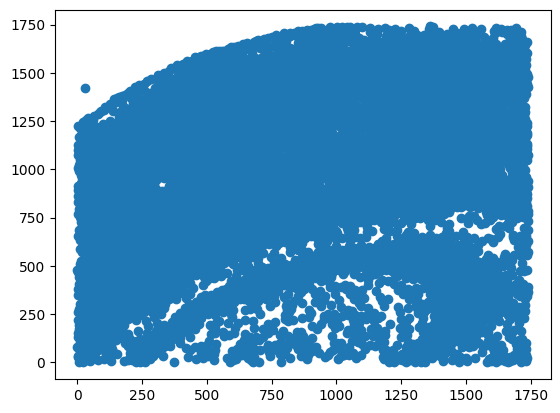

Plotting  wildtype_5_7__11


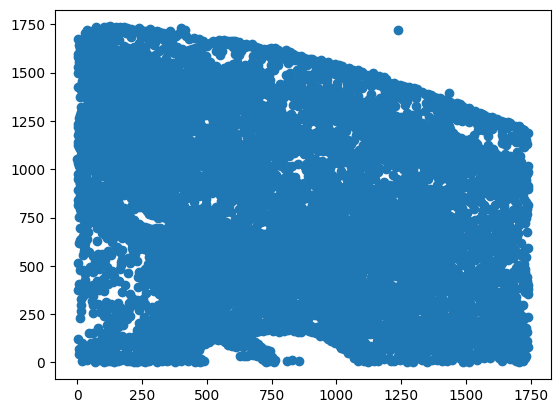

Plotting  wildtype_5_7__12


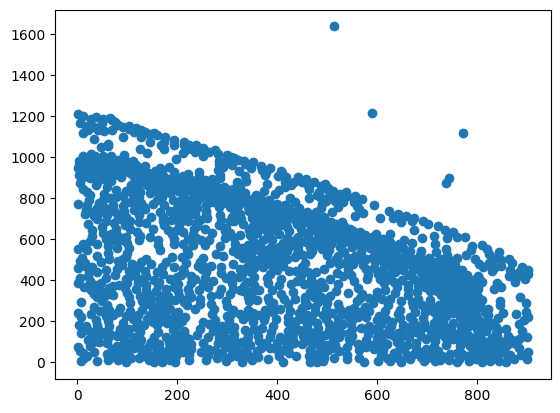

Plotting  wildtype_5_7__13


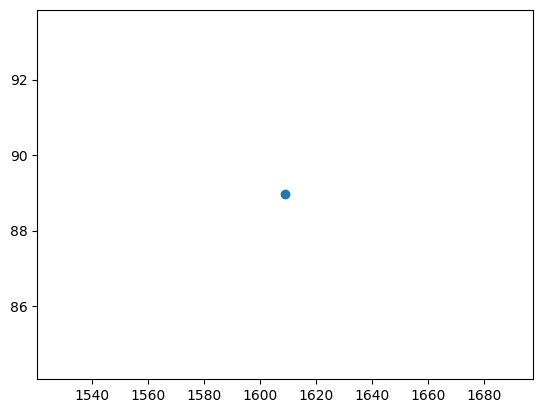

Plotting  wildtype_5_7__14


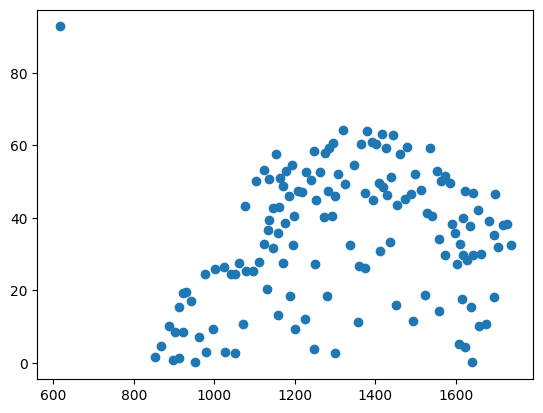

Plotting  wildtype_5_7__15


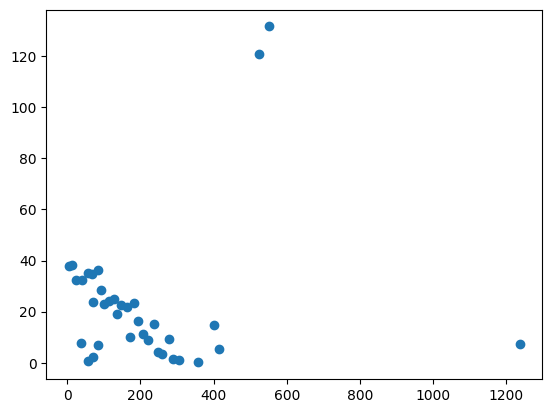

Plotting  wildtype_13_4__1


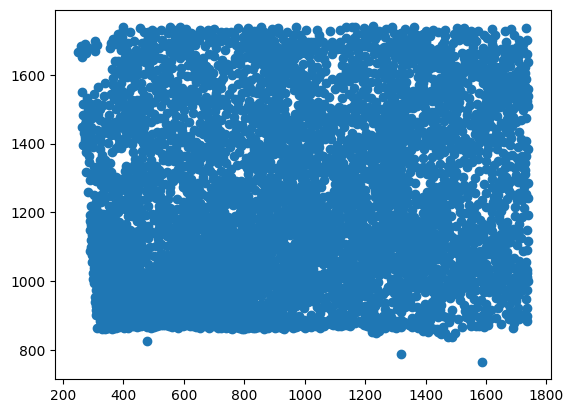

Plotting  wildtype_13_4__2


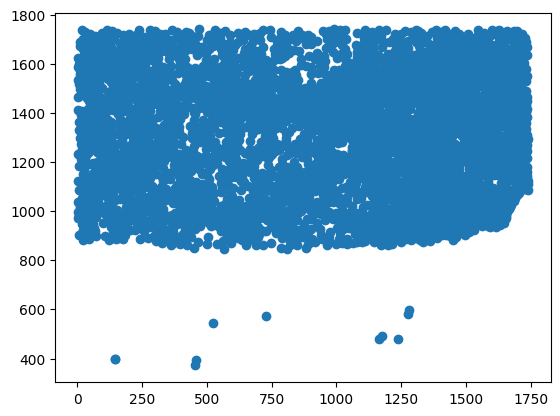

Plotting  wildtype_13_4__3


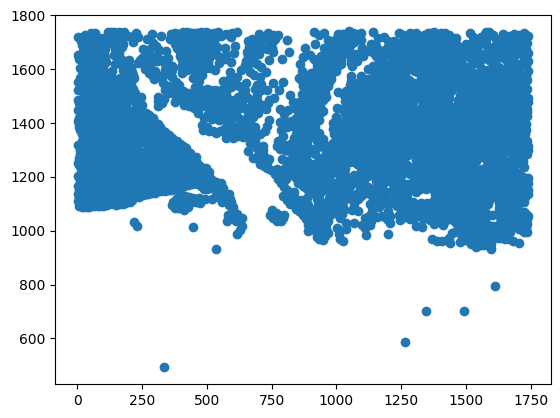

Plotting  wildtype_13_4__4


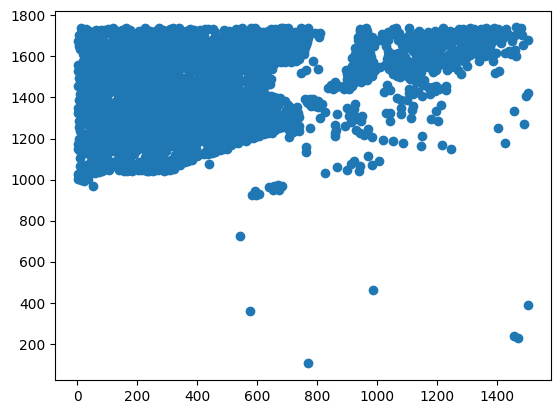

Plotting  wildtype_13_4__5


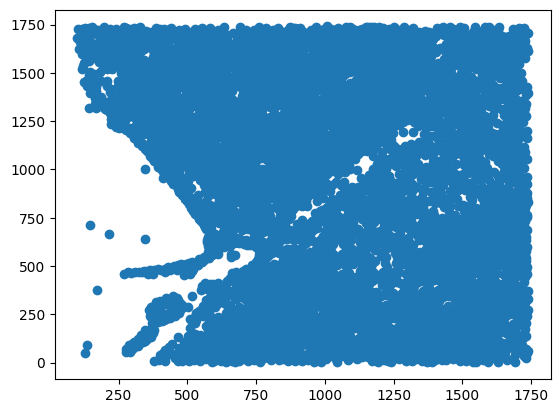

Plotting  wildtype_13_4__6


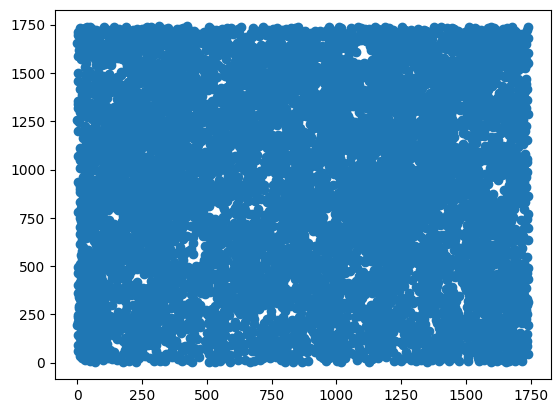

Plotting  wildtype_13_4__7


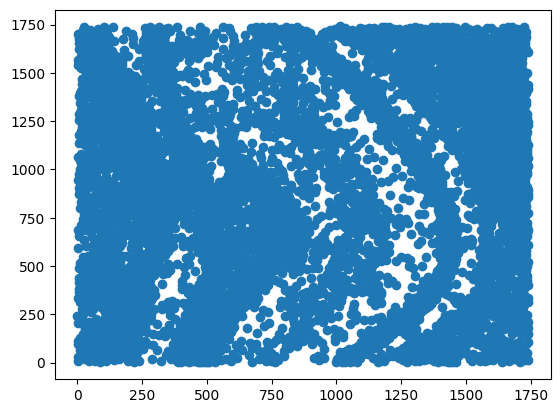

Plotting  wildtype_13_4__8


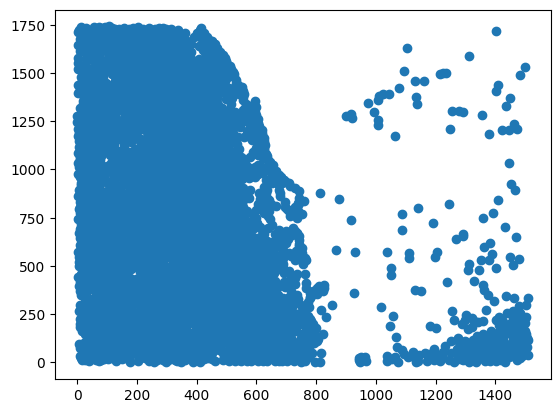

Plotting  wildtype_13_4__9


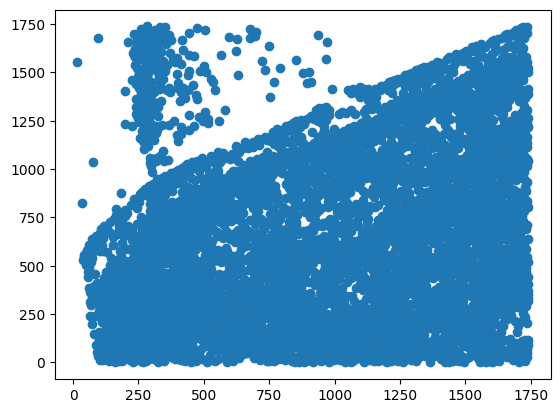

Plotting  wildtype_13_4__10


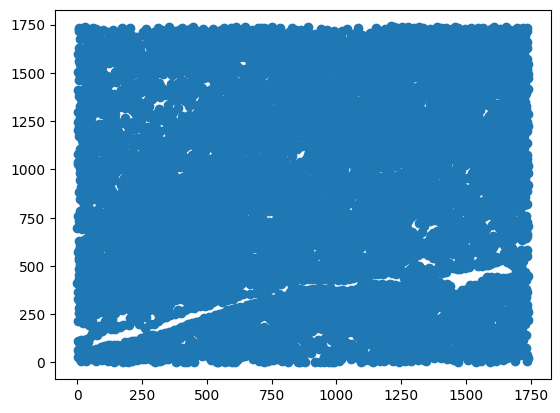

Plotting  wildtype_13_4__11


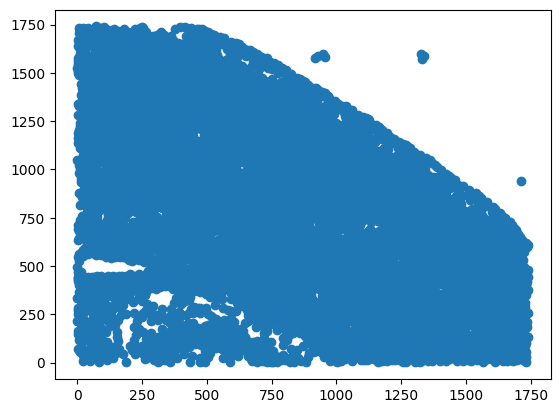

Plotting  wildtype_13_4__12


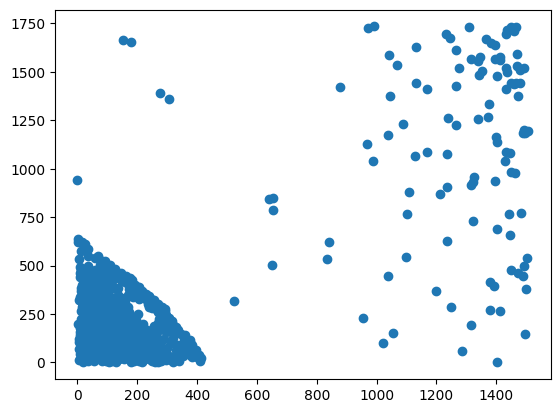

Plotting  wildtype_13_4__13


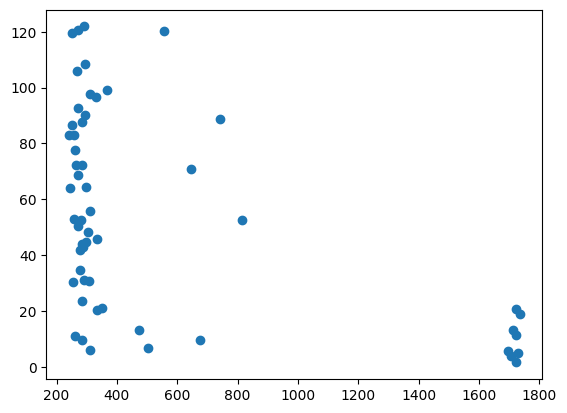

Plotting  wildtype_13_4__14


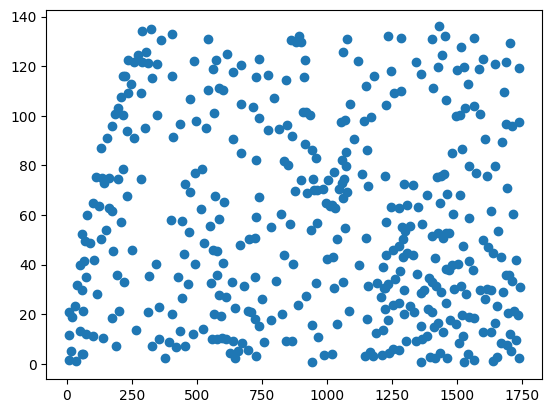

Plotting  wildtype_13_4__15


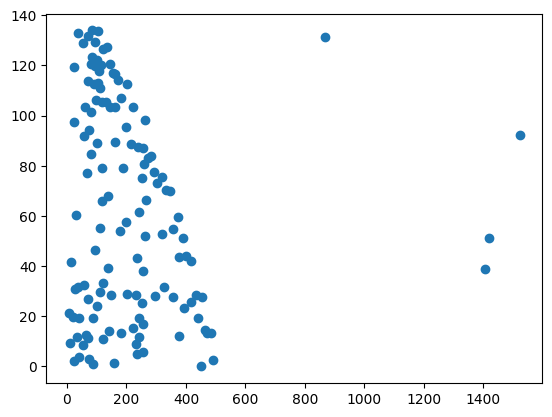

Plotting  wildtype_13_4__16


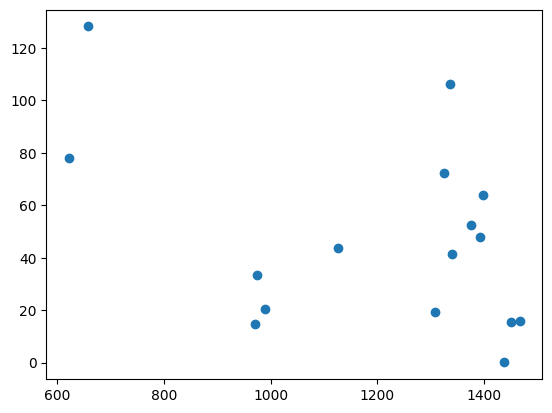

Plotting  TgCRND8_17_9__1


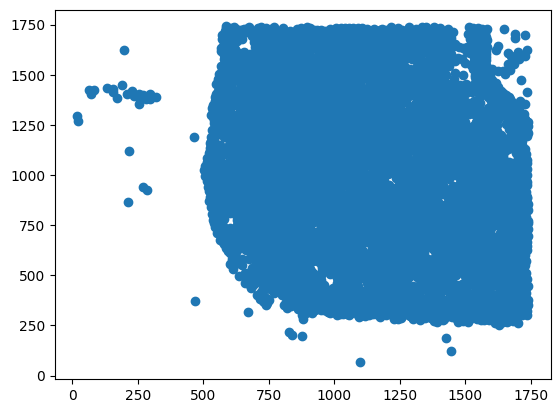

Plotting  TgCRND8_17_9__2


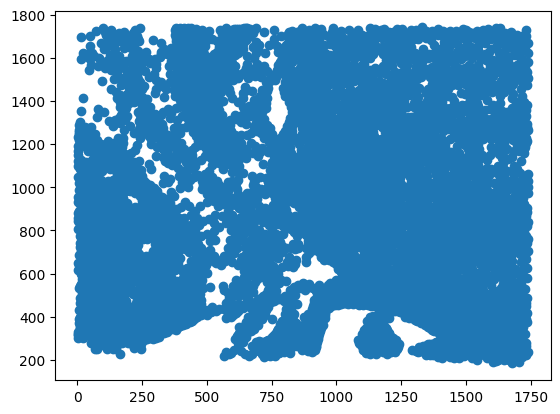

Plotting  TgCRND8_17_9__3


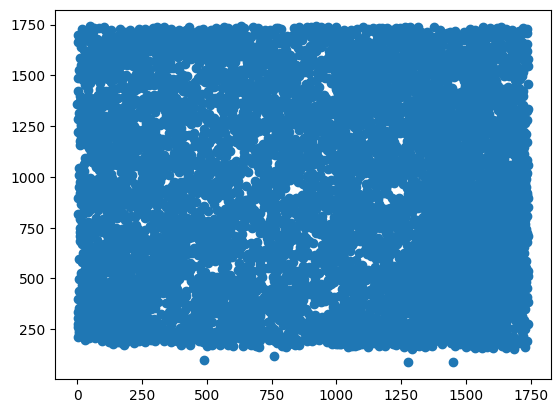

Plotting  TgCRND8_17_9__4


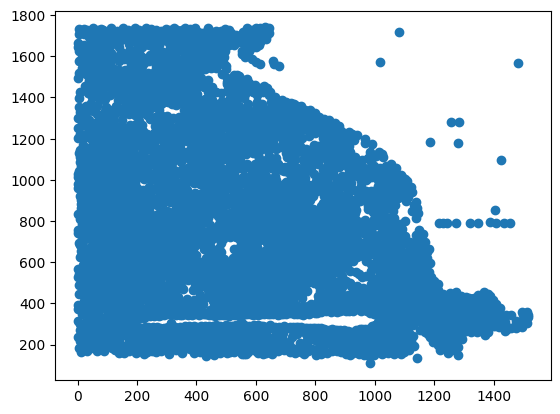

Plotting  TgCRND8_17_9__5


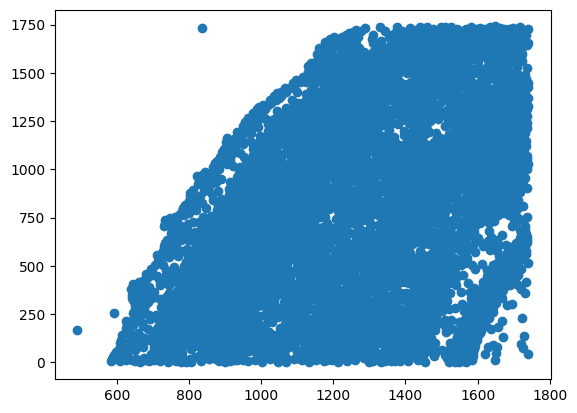

Plotting  TgCRND8_17_9__6


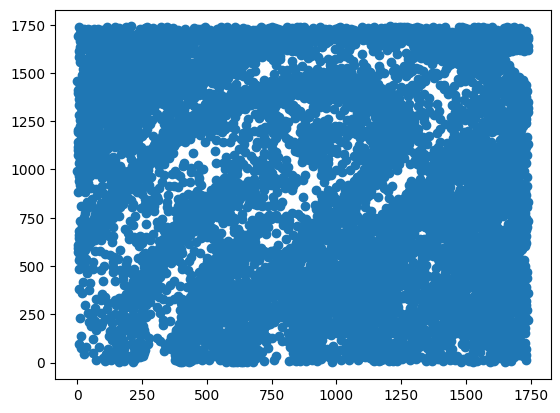

Plotting  TgCRND8_17_9__7


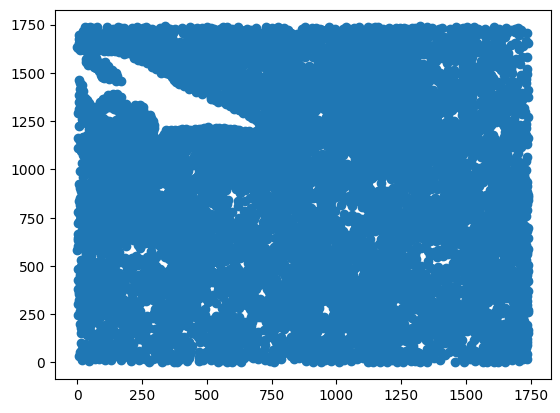

Plotting  TgCRND8_17_9__8


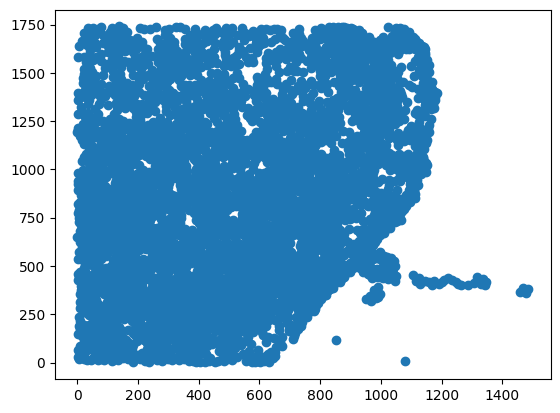

Plotting  TgCRND8_17_9__9


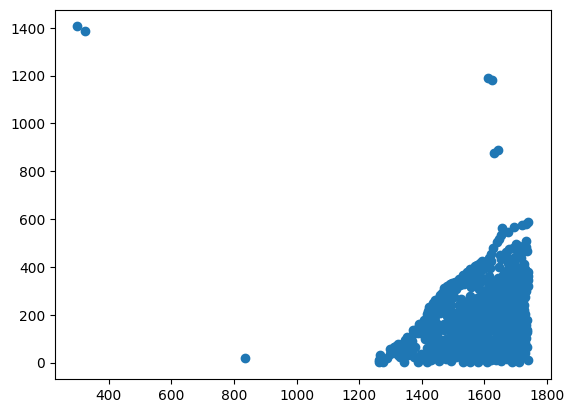

Plotting  TgCRND8_17_9__10


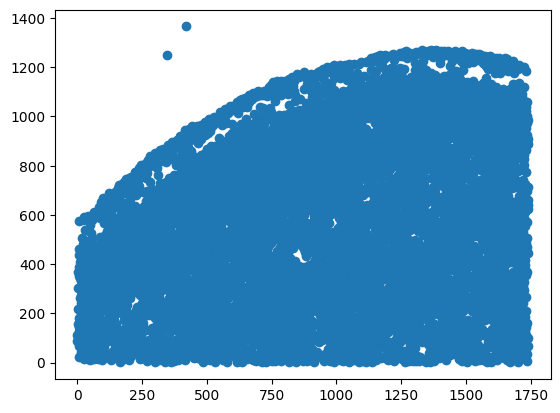

Plotting  TgCRND8_17_9__11


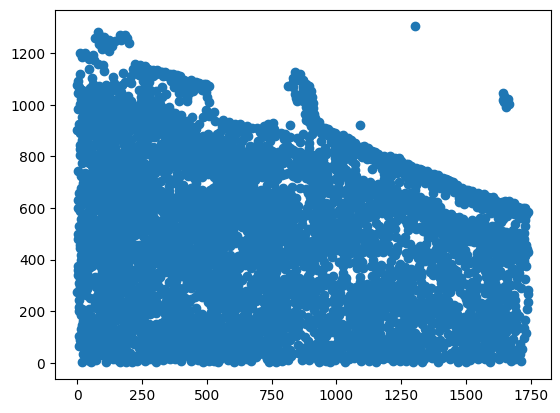

Plotting  TgCRND8_17_9__12


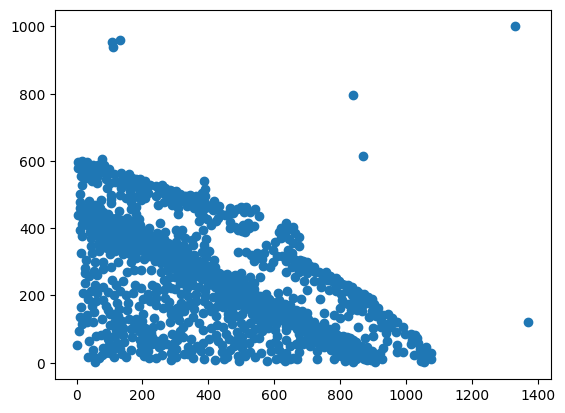

Plotting  TgCRND8_17_9__16


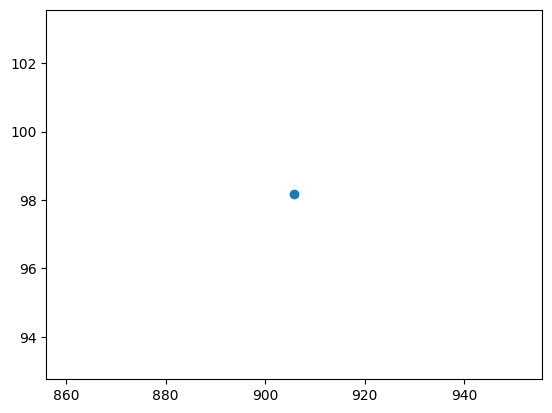

Plotting  TgCRND8_2_5__1


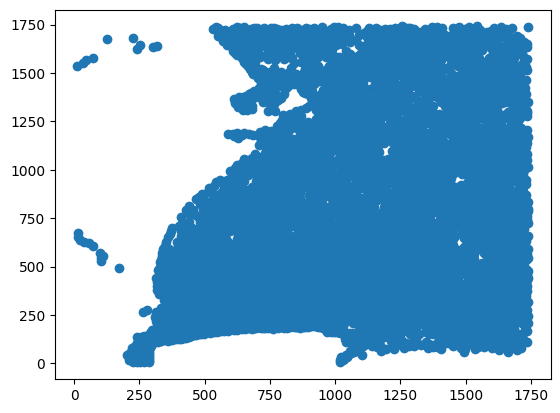

Plotting  TgCRND8_2_5__2


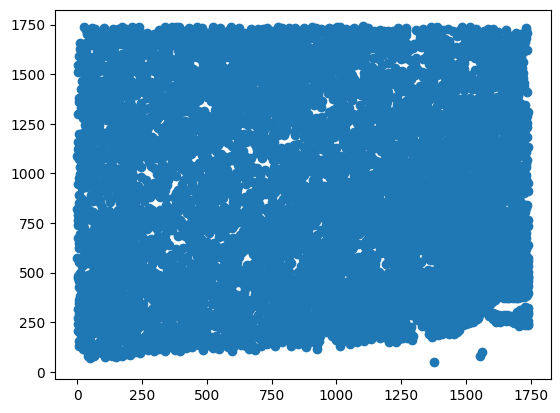

Plotting  TgCRND8_2_5__3


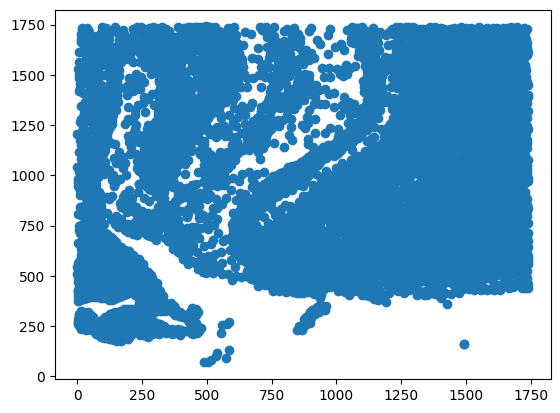

Plotting  TgCRND8_2_5__4


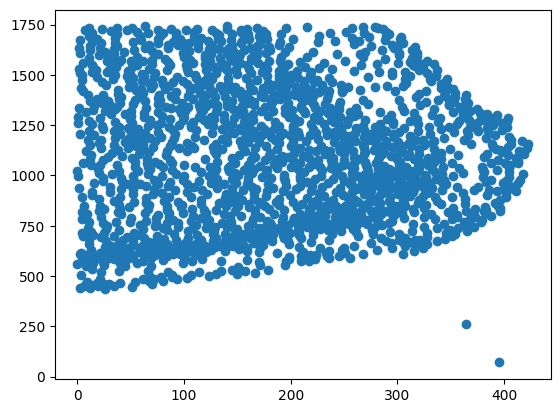

Plotting  TgCRND8_2_5__5


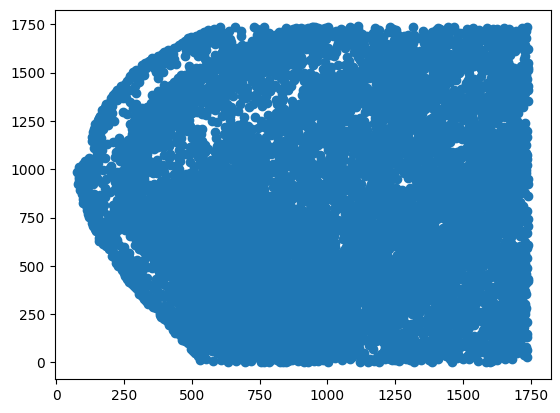

Plotting  TgCRND8_2_5__6


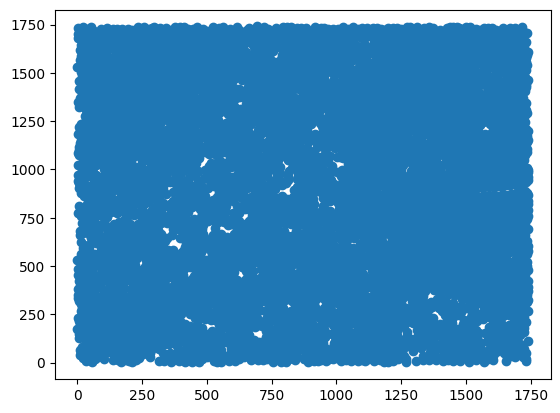

Plotting  TgCRND8_2_5__7


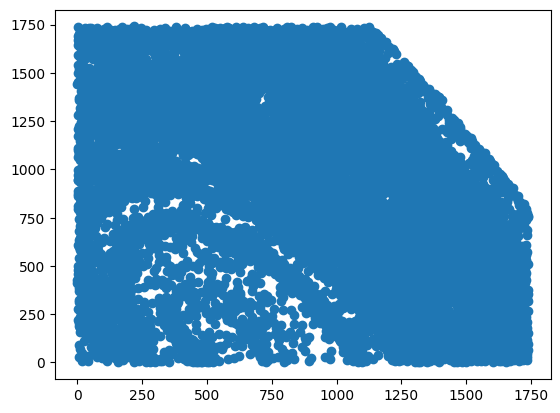

Plotting  TgCRND8_2_5__8


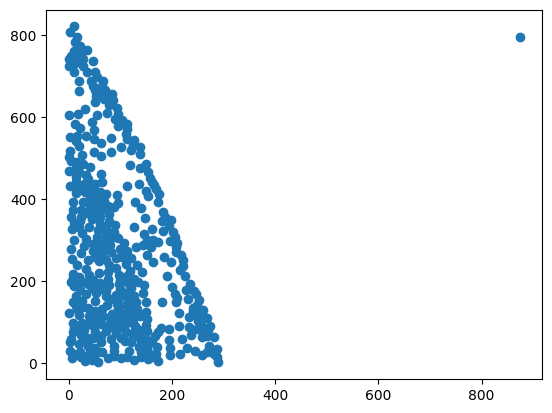

Plotting  TgCRND8_2_5__9


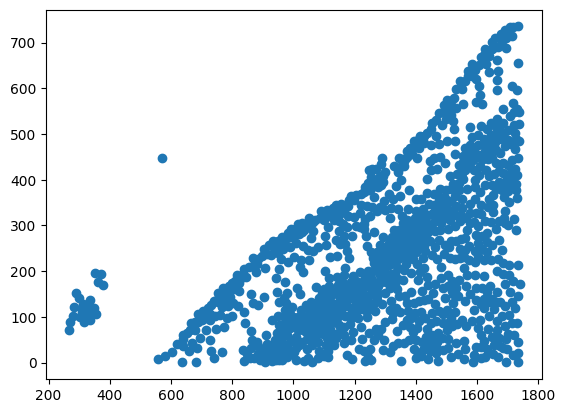

Plotting  TgCRND8_2_5__10


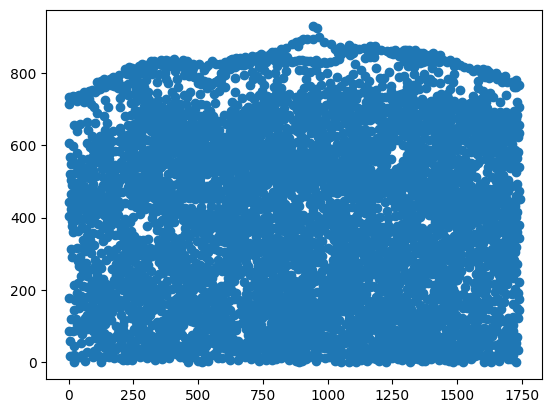

Plotting  TgCRND8_2_5__11


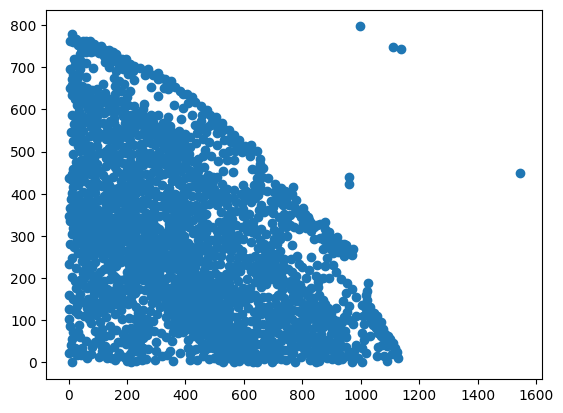

Plotting  wildtype_2_5__1


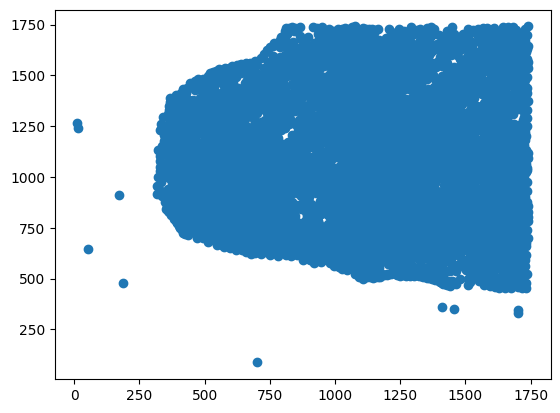

Plotting  wildtype_2_5__2


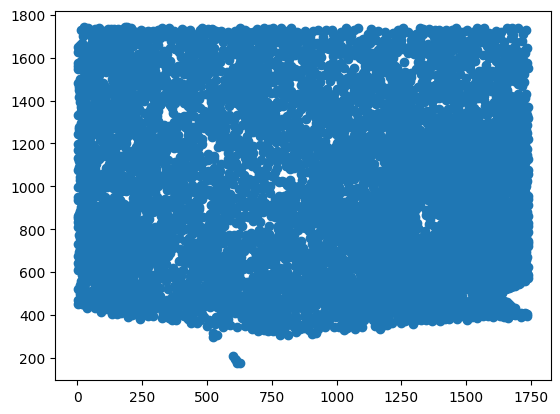

Plotting  wildtype_2_5__3


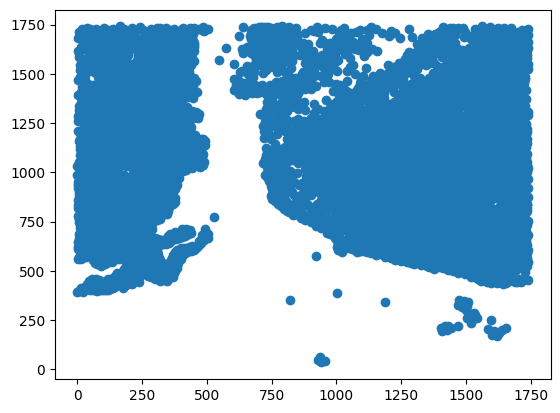

Plotting  wildtype_2_5__4


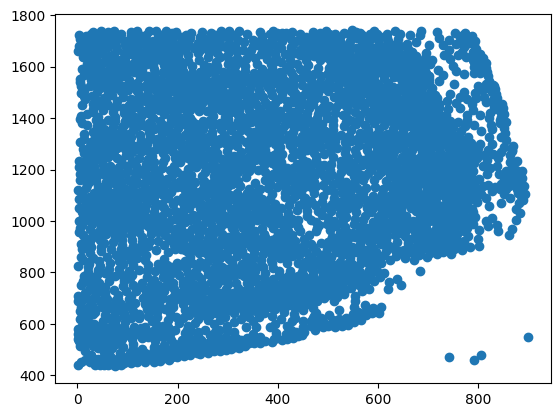

Plotting  wildtype_2_5__5


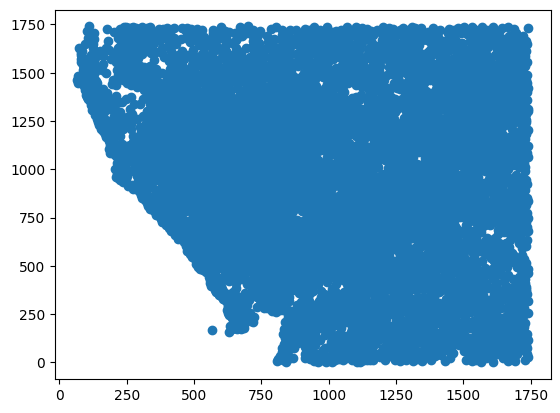

Plotting  wildtype_2_5__6


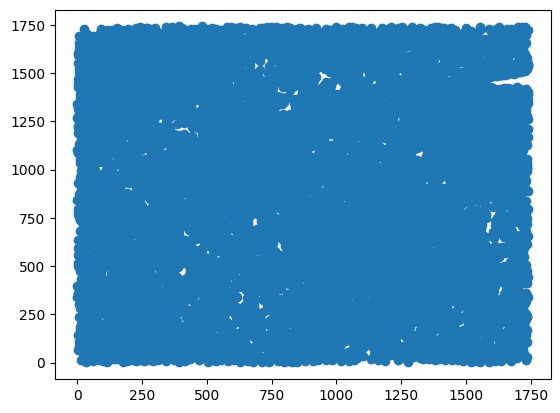

Plotting  wildtype_2_5__7


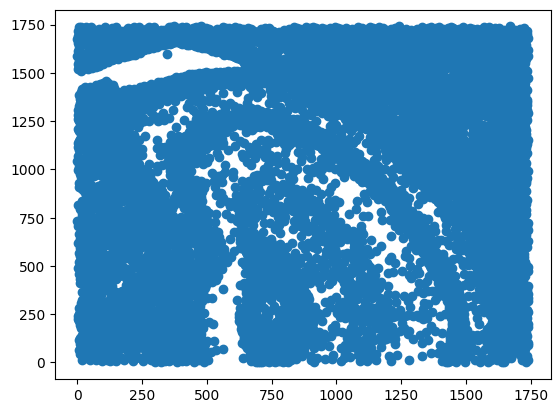

Plotting  wildtype_2_5__8


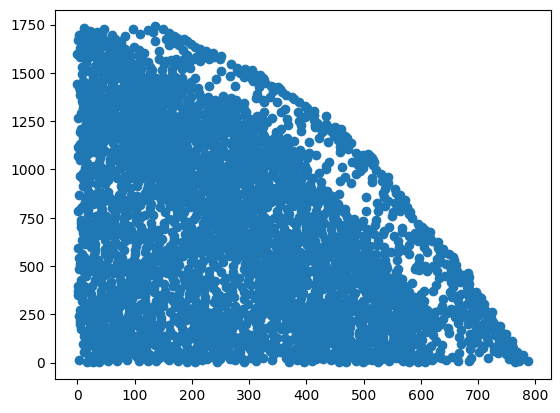

Plotting  wildtype_2_5__9


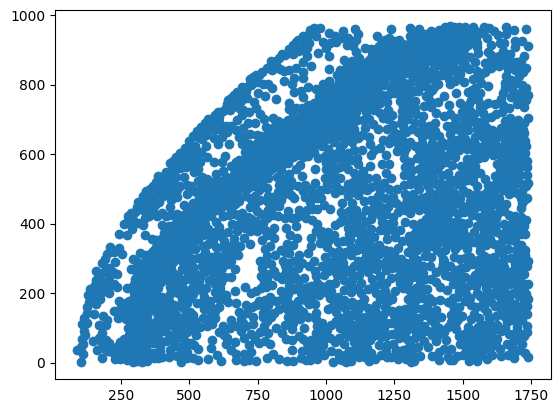

Plotting  wildtype_2_5__10


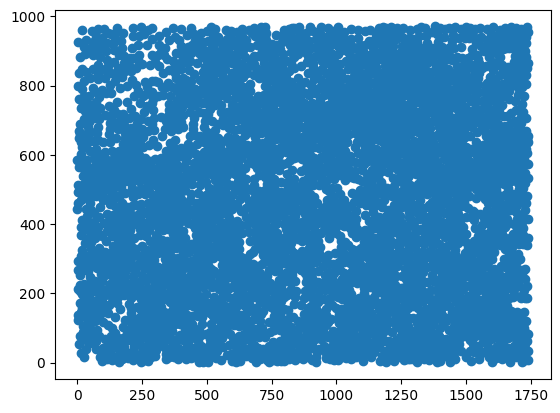

Plotting  wildtype_2_5__11


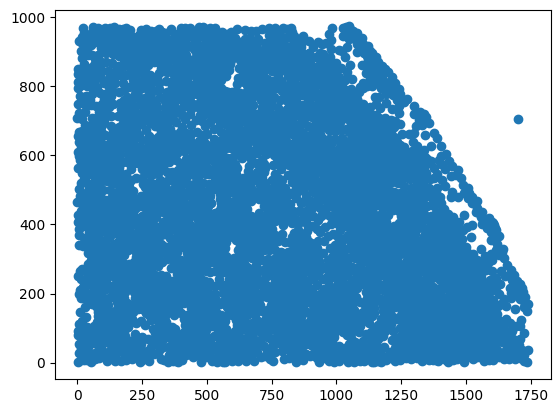

Plotting  wildtype_2_5__12


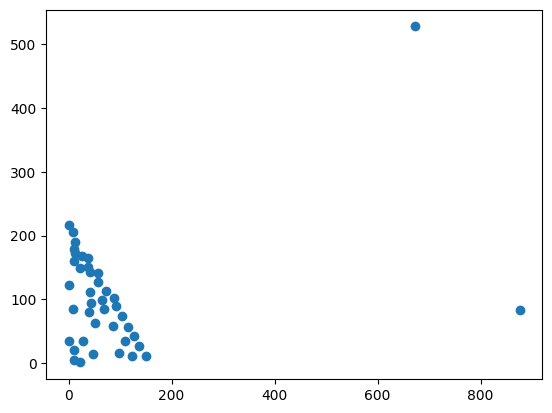

Plotting  TgCRND8_5_7__1


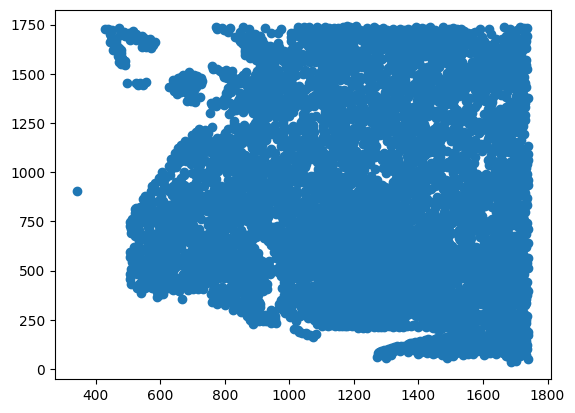

Plotting  TgCRND8_5_7__2


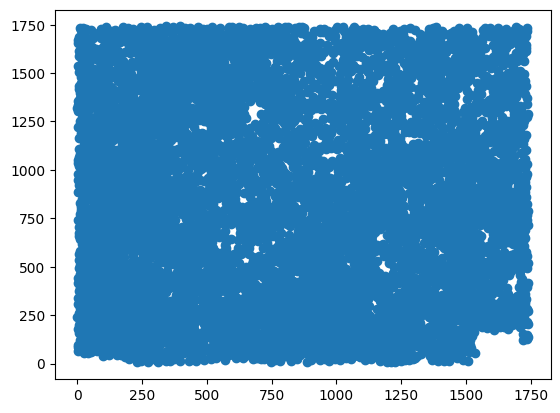

Plotting  TgCRND8_5_7__3


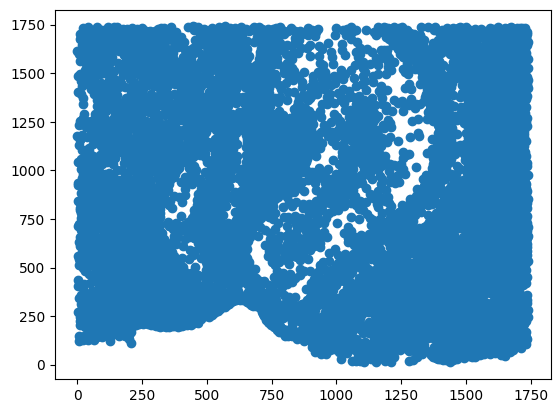

Plotting  TgCRND8_5_7__4


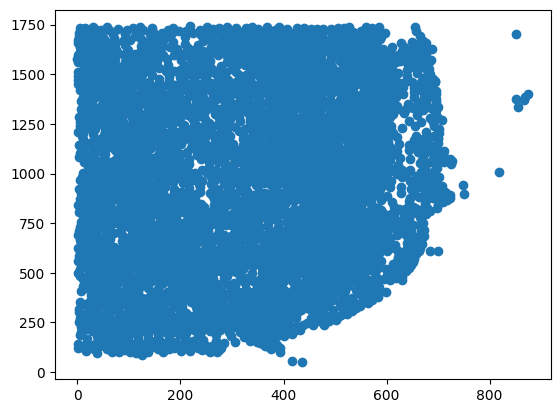

Plotting  TgCRND8_5_7__5


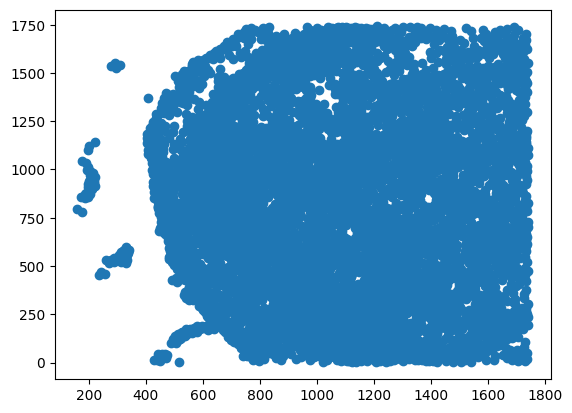

Plotting  TgCRND8_5_7__6


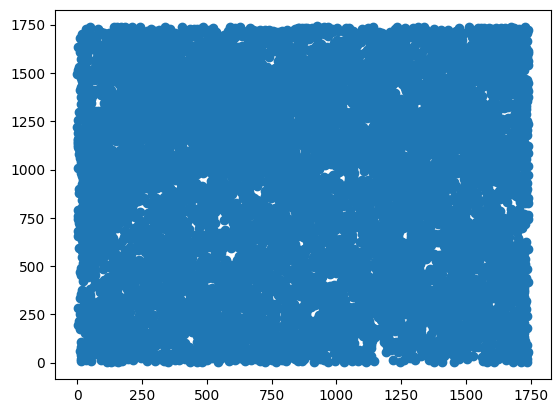

Plotting  TgCRND8_5_7__7


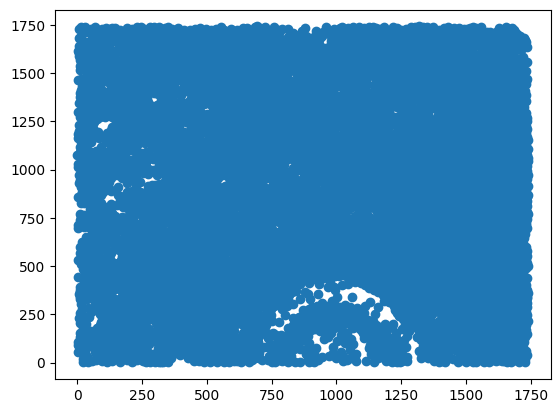

Plotting  TgCRND8_5_7__8


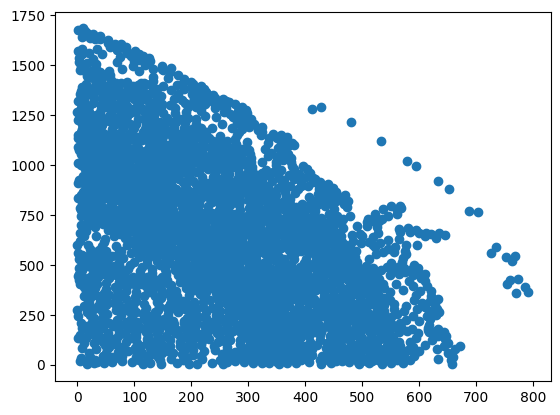

Plotting  TgCRND8_5_7__9


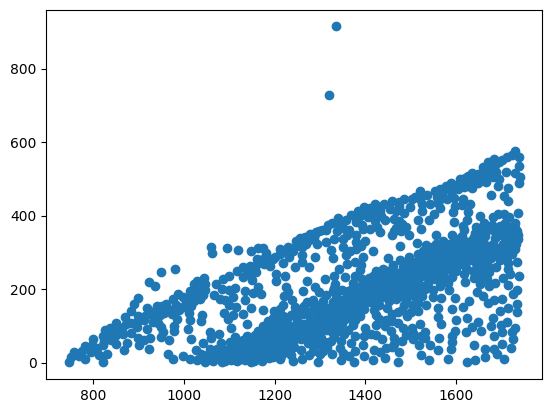

Plotting  TgCRND8_5_7__10


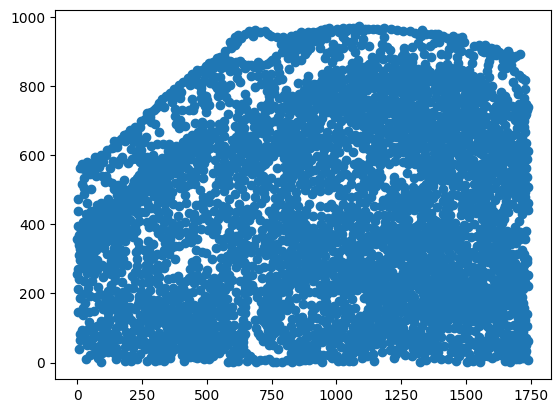

Plotting  TgCRND8_5_7__11


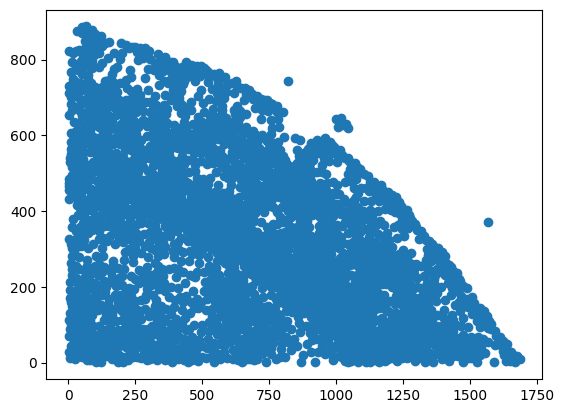

In [15]:
import matplotlib.pyplot as plt

def plot_slice(slice_name, data):
    slice_data = data[data['cell_section'] == slice_name]
    coordx = slice_data['coord_X']
    coordy = slice_data['coord_Y']
    plt.scatter(coordx, coordy)
    plt.show()

for slice_name in data3['cell_section'].unique():
    print("Plotting ", slice_name)
    plot_slice(slice_name, data3)

In [19]:
maximum_graph_size = 5000
import numpy as np
def generate_slice_indices(input_data):
        slices = input_data["cell_section"].values
        current_slice, slice_start, slice_ = slices[0], 0, []

        for i in range(1, len(slices)):
            # Check for slice change or end of slices array
            if slices[i] != current_slice or i == len(slices) - 1:
                print("Slice ", slices[i])
                print("number of cells in slice ", slices[i], " is ", len(input_data[input_data['cell_section'] == slices[i]]))
                # Determine the end of the current slice
                slice_end = i + 1 if i == len(slices) - 1 else i

                # Apply different logic based on whether maximum_graph_size is set
                if maximum_graph_size is None or :
                    slice_.extend([slice_start, slice_end])
                    print("slice_start", slice_start, "slice_end", slice_end)
                else:
                    # Generate indices with step size of maximum_graph_size
                    new_indices = np.arange(slice_start, slice_end, maximum_graph_size).astype(int)
                    slice_.extend(new_indices)
                    slice_.append(slice_end)
                    print("new_indices", new_indices, "slice_end", slice_end)

                # Update the current slice and start for the next one
                current_slice, slice_start = slices[i], i      

        print(maximum_graph_size)
        # print(np.unique(slice_))

        return np.unique(slice_)

In [ ]:
maximum_graph_size = 5000
import numpy as np

def generate_slice_indices(input_data):
        slices = input_data["cell_section"].values
        # get the indices where the slice changes
        end_indices = np.where(slices[1:] != slices[:-1])[0] + 1
        end_indices = np.concatenate([end_indices, [len(slices)]])
        
        print(end_indices)
        print(np.diff(end_indices))

        split_indices = []
        prev_index = 0

        for end_index in end_indices:
                size = end_index - prev_index
                while size > maximum_graph_size:
                        prev_index += maximum_graph_size
                        split_indices.append(prev_index)
                        size -= maximum_graph_size
                prev_index = end_index
                split_indices.append(prev_index)

        return split_indices

slice_indices = generate_slice_indices(data3[data3['donor'] == 'TgCRND8_5_7'])
print(slice_indices)


[ 5025 12049 21504 25790 31670 39896 50000 52879 53829 57458 60354]
[ 7024  9455  4286  5880  8226 10104  2879   950  3629  2896]
[5000, 5025, 10025, 12049, 17049, 21504, 25790, 30790, 31670, 36670, 39896, 44896, 49896, 50000, 52879, 53829, 57458, 60354]


In [26]:
def split_slices_from_cumulative_indices(end_indices, max_size=5000):
    """
    Given a list of cumulative end indices (like np.cumsum),
    split each original slice into smaller chunks of at most `max_size`.
    Returns a list of new cumulative end indices.
    """
    split_indices = []
    prev_index = 0

    for end_index in end_indices:
        size = end_index - prev_index
        while size > max_size:
            prev_index += max_size
            split_indices.append(prev_index)
            size -= max_size
        prev_index = end_index
        split_indices.append(prev_index)

    return split_indices

original_end_indices = [5025, 7024, 9455, 13741, 19621, 27847, 37951, 40830, 41780, 45409]
result = split_slices_from_cumulative_indices(original_end_indices)
diffs = np.diff(result)
print(result)
print(diffs)    

[5000, 5025, 7024, 9455, 13741, 18741, 19621, 24621, 27847, 32847, 37847, 37951, 40830, 41780, 45409]
[  25 1999 2431 4286 5000  880 5000 3226 5000 5000  104 2879  950 3629]


In [20]:
slice_indices = generate_slice_indices(data3[data3['donor'] == 'TgCRND8_5_7'])
diffs = np.diff(slice_indices)
print(diffs)

Slice  TgCRND8_5_7__2
number of cells in slice  TgCRND8_5_7__2  is  7024
new_indices [   0 5000] slice_end 5025
Slice  TgCRND8_5_7__3
number of cells in slice  TgCRND8_5_7__3  is  9455
new_indices [ 5025 10025] slice_end 12049
Slice  TgCRND8_5_7__4
number of cells in slice  TgCRND8_5_7__4  is  4286
new_indices [12049 17049] slice_end 21504
Slice  TgCRND8_5_7__5
number of cells in slice  TgCRND8_5_7__5  is  5880
new_indices [21504] slice_end 25790
Slice  TgCRND8_5_7__6
number of cells in slice  TgCRND8_5_7__6  is  8226
new_indices [25790 30790] slice_end 31670
Slice  TgCRND8_5_7__7
number of cells in slice  TgCRND8_5_7__7  is  10104
new_indices [31670 36670] slice_end 39896
Slice  TgCRND8_5_7__8
number of cells in slice  TgCRND8_5_7__8  is  2879
new_indices [39896 44896 49896] slice_end 50000
Slice  TgCRND8_5_7__9
number of cells in slice  TgCRND8_5_7__9  is  950
new_indices [50000] slice_end 52879
Slice  TgCRND8_5_7__10
number of cells in slice  TgCRND8_5_7__10  is  3629
new_indices [5

In [16]:
print(data3['cell_section'].value_counts())

cell_section
TgCRND8_5_7__7       10104
TgCRND8_5_7__3        9455
wildtype_13_4__10     8681
TgCRND8_2_5__7        8659
TgCRND8_2_5__6        8508
                     ...  
wildtype_2_5__12        41
wildtype_5_7__15        36
wildtype_13_4__16       16
wildtype_5_7__13         1
TgCRND8_17_9__16         1
Name: count, Length: 78, dtype: int64


In [10]:
slice_name = 'TgCRND8_5_7__8'

# get the data with cell_section = slice_name from data3
slice_data = data3[data3['cell_section'] == slice_name]
print(slice_data.shape)
slice_data.head()

(2879, 6)


,coord_X,coord_Y,cell_class,cell_section,donor,cell_id
350257,495.270264,58.529846,18,TgCRND8_5_7__8,TgCRND8_5_7,350257
350258,241.341479,1058.456067,10,TgCRND8_5_7__8,TgCRND8_5_7,350258
350259,482.012671,409.922046,10,TgCRND8_5_7__8,TgCRND8_5_7,350259
350260,375.595825,502.585535,1,TgCRND8_5_7__8,TgCRND8_5_7,350260
350261,448.041309,327.227588,10,TgCRND8_5_7__8,TgCRND8_5_7,350261


In [13]:
import numpy as np

arr = np.array([0, 4820, 8375, 11271, 16271, 18096, 23096, 27221, 31444, 36444,
                37136, 42136, 45123, 50123, 54896, 57773, 58681, 58685, 58689, 58693])

diffs = np.diff(arr)
print(diffs)

[5000   25 5000 2024 5000 4455 4286 5000  880 5000 3226 5000 5000  104
 2879  950 3629 2896]

[4820 3555 2896 5000 1825 5000 4125 4223 5000  692 5000 2987 5000 4773
 2877  908    4    4    4]


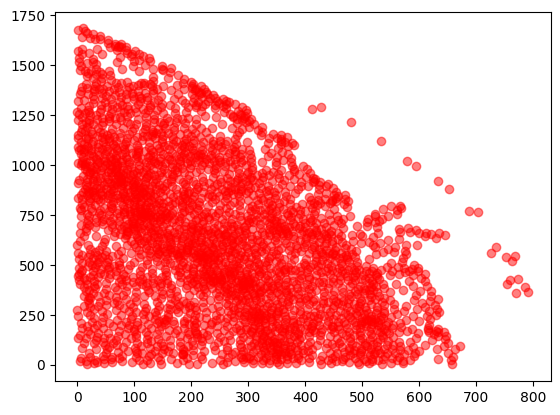

In [11]:
import matplotlib.pyplot as plt
# plot the slice coordinates
plt.scatter(slice_data['coord_X'], slice_data['coord_Y'], c='red', alpha=0.5)
plt.show()

In [10]:
data2 = pd.read_csv('/mlbio_scratch/anagupta/xenium_preprocessed/sliced_data/data2.csv', usecols=["coord_X", "coord_Y", "cell_id", "donor", "cell_class", "cell_section"]).set_index('cell_id')
data2.index.name = 'cell_id'
print(data2.head())

             coord_X      coord_Y  cell_class     cell_section         donor
cell_id                                                                     
0         369.561494  1605.220020          12  wildtype_5_7__1  wildtype_5_7
1         628.624390  1232.846350          27  wildtype_5_7__1  wildtype_5_7
2         346.296869  1556.784235           6  wildtype_5_7__1  wildtype_5_7
3        1498.620660  1161.344458           9  wildtype_5_7__1  wildtype_5_7
4         714.048611  1739.703986           3  wildtype_5_7__1  wildtype_5_7


In [11]:
# get the data with cell_section = slice_name from data3
slice_data2 = data2[data2['cell_section'] == slice_name]
slice_data2.head()

,coord_X,coord_Y,cell_class,cell_section,donor
cell_id,,,,,
38350,418.670239,1380.602124,4,wildtype_5_7__8,wildtype_5_7
38351,405.096387,1217.580383,4,wildtype_5_7__8,wildtype_5_7
38352,307.995923,15.333099,2,wildtype_5_7__8,wildtype_5_7
38353,396.686450,740.235034,11,wildtype_5_7__8,wildtype_5_7
38354,418.681860,1347.750745,4,wildtype_5_7__8,wildtype_5_7


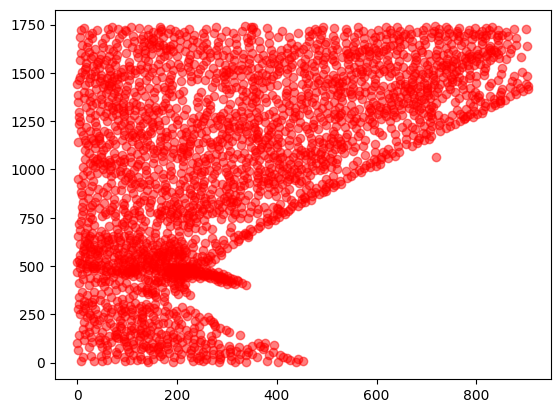

In [12]:
import matplotlib.pyplot as plt
# plot the slice coordinates
plt.scatter(slice_data2['coord_X'], slice_data2['coord_Y'], c='red', alpha=0.5)
plt.show()

In [16]:
# sd1 = sliced_data['wildtype_5_7__8']
# sd2 = sliced_data['wildtype_5_7__9']

# print(sd1.shape)
# print(sd2.shape)

# sd1['cell_id'].isin(sd2['cell_id']).sum()

# count duplicates in all pairs of sliced data
for slice_name1, window_data1 in sliced_data.items():
    for slice_name2, window_data2 in sliced_data.items():
        if slice_name1 != slice_name2:
            if window_data1['cell_id'].isin(window_data2['cell_id']).sum() > 0:
                print(slice_name1, slice_name2)
                print(window_data1['cell_id'].isin(window_data2['cell_id']).sum())


wildtype_5_7__1 wildtype_5_7__2
62
wildtype_5_7__1 wildtype_5_7__5
137
wildtype_5_7__1 wildtype_5_7__6
2
wildtype_5_7__2 wildtype_5_7__1
62
wildtype_5_7__2 wildtype_5_7__3
62
wildtype_5_7__2 wildtype_5_7__5
2
wildtype_5_7__2 wildtype_5_7__6
136
wildtype_5_7__2 wildtype_5_7__7
4
wildtype_5_7__3 wildtype_5_7__2
62
wildtype_5_7__3 wildtype_5_7__4
125
wildtype_5_7__3 wildtype_5_7__6
2
wildtype_5_7__3 wildtype_5_7__7
104
wildtype_5_7__3 wildtype_5_7__8
1
wildtype_5_7__4 wildtype_5_7__3
125
wildtype_5_7__4 wildtype_5_7__7
1
wildtype_5_7__4 wildtype_5_7__8
34
wildtype_5_7__5 wildtype_5_7__1
137
wildtype_5_7__5 wildtype_5_7__2
2
wildtype_5_7__5 wildtype_5_7__6
96
wildtype_5_7__5 wildtype_5_7__9
97
wildtype_5_7__5 wildtype_5_7__10
6
wildtype_5_7__6 wildtype_5_7__1
2
wildtype_5_7__6 wildtype_5_7__2
136
wildtype_5_7__6 wildtype_5_7__3
2
wildtype_5_7__6 wildtype_5_7__5
96
wildtype_5_7__6 wildtype_5_7__7
110
wildtype_5_7__6 wildtype_5_7__9
6
wildtype_5_7__6 wildtype_5_7__10
90
wildtype_5_7__6 wildt

In [ ]:
# save all the sliced tiffs
# for slice_name, window in sliced_tiffs.items():
#     tifffile.imwrite(f"/Users/ananyagupta/MLBio/sliced_tiffs/{slice_name}.tif", window)

import imageio
import io
import tarfile

output_dir = "/mlbio_scratch/anagupta/xenium_preprocessed/sliced_data"

os.makedirs(output_dir, exist_ok=True)

tar_file_path = os.path.join(output_dir, f"slice_images.tar")
with tarfile.open(tar_file_path, "w") as tar:
    for slice_name, window in sliced_tiffs.items():
        # Normalize if needed
        if window.dtype != np.uint8:
            min_val = np.min(window)
            max_val = np.max(window)
            if max_val > min_val:
                window_norm = (window - min_val) / (max_val - min_val)
            else:
                window_norm = np.zeros_like(window)
            window_uint8 = (window_norm * 255).astype(np.uint8)
        else:
            window_uint8 = window
        # imageio.imwrite(f"{output_dir}/{slice_name}.png", window_uint8)
        
        try:
            # Save the image to an in-memory buffer
            img_buffer = io.BytesIO()
            np.save(img_buffer, window_uint8)
            img_buffer.seek(0)
            
            # Add the image to the tar file
            tar_info = tarfile.TarInfo(name=f"{slice_name}.npy")
            tar_info.size = img_buffer.getbuffer().nbytes
            tar.addfile(tarinfo=tar_info, fileobj=img_buffer)
            print(f"Saved {slice_name}")
        except Exception as e:
            print(f"Error saving {slice_name}: {e}")
    print(f"Saved {len(sliced_tiffs)} images")

In [ ]:
# save the concatenated data as csv
data.to_csv(os.path.join(output_dir, 'data.csv'), index=False)
print(f"Saved {len(data)} rows")